In [2]:
%run common.ipy

Using DW in /home/davo/Documents/GRASIA/daostack-notebooks/datawarehouse from date 2023-05-01T00:00:00
DW version 1.1.9
dao-analyzer version: 1.2.6
cache-scripts version: 1.1.9


In [3]:
# Data tools
import pandas as pd
import numpy as np

# Visualization
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import plotly.io as pio
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Jupyter
from IPython.display import Markdown as Md
import ipywidgets as widgets

from dao_analyzer.web.apps.daostack.data_access.daos.metric import srcs as DAOSTACK

# Local modules
%load_ext autoreload
%autoreload 1
%aimport utils

pio.templates.default = 'custom_timeseries_wide'

# Resumen de los datos

## ¿Cuantos stakers hay?

In [4]:
dfs = utils.get_df('dfs')
dfh = utils.get_df('dfh')
print("Total:", stakers_total := dfs['staker'].nunique())
print(stakers_bynetwork := dfs.groupby('network')['staker'].nunique())
print(users_bynetwork := dfh.groupby('network')['address'].nunique())

stakers_mainnet = stakers_bynetwork['mainnet']
stakers_xdai = stakers_bynetwork['xdai']
stakers_both = stakers_bynetwork.sum() - stakers_total

Md(f"""
Hay un total de {stakers_total} _stakers_, {stakers_mainnet} de ellos en mainnet,
y {stakers_xdai} en xdai. Nótese que hay {stakers_both} de ellos que son stakers en ambas redes.
""")

Total: 265
network
mainnet    229
xdai        70
Name: staker, dtype: int64
network
mainnet    6139
xdai       3234
Name: address, dtype: int64



Hay un total de 265 _stakers_, 229 de ellos en mainnet,
y 70 en xdai. Nótese que hay 34 de ellos que son stakers en ambas redes.


# ¿El staking es interno o externo?

En esta sección vamos a ver si qué porcentaje del staking es intra-dao (hecho por holders de la DAO)

La idea es:
- Obtener la lista de holders
- Por cada propuesta, comprobar qué porcentaje de sus stakes han sido realizados por holders
  - Crear una nueva tabla join de prop x stakes, donde a stake se le ha puesto un bool "internal"

## Marcar internal stakes

Hecho en [Prepare data](./0%20Prepare%20Data.ipynb)

## Número total de stakes

In [5]:
dfs.columns

Index(['network', 'id', 'createdAt', 'staker', 'outcome', 'amount', 'dao',
       'proposal', 'createdAtMonth', 'daoRegister', 'daoName',
       'internalPlatform', 'internalDAO', 'isProposer', 'isVoter'],
      dtype='object')

In [6]:
dfs = utils.append_dao_info(utils.get_df('dfs', registered_only=True))

# Moved to 0 Prepare Data.ipynb
# display(dfs)
# dfs['internalPlatform'] = dfs['staker'].isin(dfh['address'])
# dfs['internalDAO'] = dfs[['dao', 'staker']].apply(tuple, 1).isin(dfh[['dao', 'address']].apply(tuple, 1))

def _print_n_stakes(df):
    n_stakes = len(df)
    n_stakes_out_p = (~df.internalPlatform).abs().sum()
    n_stakes_out_d = (~df.internalDAO).abs().sum()
    n_stakes_out_d_nv = (~df.internalDAO & ~df.isProposer).sum()

    pct_stakes_out_p = n_stakes_out_p / n_stakes * 100
    pct_stakes_out_d = n_stakes_out_d / n_stakes * 100
    pct_stakes_out_d_nv = n_stakes_out_d_nv / n_stakes * 100
    
    n_upstakes = (df['amount'] > 0).sum()
    n_downstakes = (df['amount'] < 0).sum()
    
    n_stakes_prop = df.isProposer.sum()
    pct_stakes_prop = n_stakes_prop / n_stakes * 100
    
    n_stakes_voters = df.isVoter.sum()
    pct_stakes_voters = n_stakes_voters / n_stakes * 100
    
    n_stakes_any = (df.isProposer | df.isVoter).sum()
    pct_stakes_any = n_stakes_any / n_stakes * 100

    print(f"There are {n_stakes} stakes in total")
    print(f"{n_upstakes} ({n_upstakes/n_stakes*100:.2f}%) are upstakes, and {n_downstakes} ({n_downstakes/n_stakes*100:.2f}%) are downstakes")
    print(f"There are {n_stakes_out_d} stakes ({pct_stakes_out_d:.2f}%) from users outside their DAO")
    print(f"There are {n_stakes_out_d_nv} stakes ({pct_stakes_out_d_nv:.2f}%) from users outside their DAO who were not the proposer")
    print(f"There are {n_stakes_out_p} stakes ({pct_stakes_out_p:.2f}%) from users outside DAOstack")
    print(f"There are {n_stakes_prop} stakes ({pct_stakes_prop:.2f}%) from the user who proposed")
    print(f"There are {n_stakes_voters} stakes ({pct_stakes_voters:.2f}%) from users who voted in the proposal")
    print(f"There are {n_stakes_any} stakes ({pct_stakes_any:.2f}%) from users who voted or proposed")
    
_print_n_stakes(dfs)
print("=== mainnet ===")
_print_n_stakes(dfs[dfs.network == 'mainnet'])
print()
print("=== xdai ===")
_print_n_stakes(dfs[dfs.network == 'xdai'])
print()
print("=== no dxDAO ===")
_print_n_stakes(dfs[dfs['group'] != 'dxDAO'])

dfs

There are 5110 stakes in total
4715 (92.27%) are upstakes, and 395 (7.73%) are downstakes
There are 627 stakes (12.27%) from users outside their DAO
There are 584 stakes (11.43%) from users outside their DAO who were not the proposer
There are 150 stakes (2.94%) from users outside DAOstack
There are 1698 stakes (33.23%) from the user who proposed
There are 2808 stakes (54.95%) from users who voted in the proposal
There are 3460 stakes (67.71%) from users who voted or proposed
=== mainnet ===
There are 3115 stakes in total
2779 (89.21%) are upstakes, and 336 (10.79%) are downstakes
There are 592 stakes (19.00%) from users outside their DAO
There are 549 stakes (17.62%) from users outside their DAO who were not the proposer
There are 131 stakes (4.21%) from users outside DAOstack
There are 816 stakes (26.20%) from the user who proposed
There are 1547 stakes (49.66%) from users who voted in the proposal
There are 1871 stakes (60.06%) from users who voted or proposed

=== xdai ===
There ar

,network,id,createdAt,staker,outcome,amount,dao,proposal,createdAtMonth,daoRegister,daoName,internalPlatform,internalDAO,isProposer,isVoter,group,name,register
0,mainnet,0x002a6f4b1986b3d700b470bdcd835a5c828e8e9cb04d...,2019-06-21 20:02:25,0x26904e77a65ba7ff95803d804ef46fc6d8f33720,Pass,60.000,0x6bee9b81e434f7afce72a43a4016719315069539,0x1d7514de86913f1f306c237d2f6c88ac31098afb00cd...,2019-06,registered,Kyber DAO Exp#2,True,True,True,True,Kyber DAO Exp#2,Kyber DAO Exp#2,registered
1,mainnet,0x0034e58174fdef6f34fa3df9e4582297a74e0481d200...,2019-07-29 03:16:15,0x4abe45a46ff4be05545684ab7aa1894628d9dca6,Pass,1.000,0x519b70055af55a007110b4ff99b0ea33071c720a,0xa0225277f6b1f3b4f0bedc3e4d92ed8f3ba53e584781...,2019-07,registered,Kyber DAO Exp#2,False,False,False,False,dxDAO,dxDAO,registered
2,mainnet,0x003855e34d7163f25f7b3abf4c8584414cf1dd3cf18c...,2019-04-22 18:52:45,0xf16294a979a027f297dace2f618cb57bc4bf5d16,Pass,150.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0xf37c69b6340e07c14ec9a9cac73a04682d5987d183f8...,2019-04,registered,Kyber DAO Exp#2,True,True,False,True,Genesis Alpha,Genesis Alpha,registered
3,mainnet,0x004d8429b916138dfc1386b71922a9efe28c5e507eb1...,2019-04-21 14:26:21,0xce7298e5ef1ae8af0573edc2ebd03ab0f837e214,Pass,300.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0x9421968a79dfc6b9437c04810293ff7f732fed2190ba...,2019-04,registered,Kyber DAO Exp#2,True,True,False,True,Genesis Alpha,Genesis Alpha,registered
4,mainnet,0x006812f41b36c70bc1403953407457b165f07b666d5d...,2019-08-05 19:01:08,0xa15ca74e65bf72730811abf95163e89ad9b9dff6,Fail,-100.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0x7fd26b2118068bd2e38e62d0b833fe49962db9e2ebaa...,2019-08,registered,Kyber DAO Exp#2,True,True,False,False,Genesis Alpha,Genesis Alpha,registered
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5105,xdai,0xa576432220fc166f51106bb1f0a8aab6b445f2281fc6...,2021-05-07 19:15:10,0xe16d3664b313bd5fb8d911b467047e3cb4ed853d,Pass,2200.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0x77635c47f54eeec7b3de249d60a9743aa5680edea8e8...,2021-05,registered,xDXdao,True,True,False,True,dxDAO,xDXdao,registered
5106,xdai,0xffdb827722dd27c4b13969d2933acb50cf4c119a1d18...,2022-06-15 16:24:05,0x1861974f32eacdcced0f81b0f8eccfed58153a9d,Pass,1500.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0xc7d58c37c58f7ec8557e8f6c78bf84afdc9eb14f5ec8...,2022-06,registered,BuffiDAO,True,True,False,False,dxDAO,xDXdao,registered
5107,xdai,0xffe1f6b2cc50ac2b4b61cff94ef25edba7734d38d3e2...,2022-03-12 01:58:25,0xbc3a058d1c919f6b1f48e8846246d04d467902c8,Pass,5.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0x122f3766bca165927f6696f2bed943198ca8a0f2f2ef...,2022-03,registered,BuffiDAO,True,True,False,True,dxDAO,xDXdao,registered
5108,xdai,0xffeb73bee7bb025e08acbb289ce4f7fbf1d20e79de0e...,2021-05-09 01:17:20,0x40a57a5d9b618b9a49307b530736b4f51e008741,Pass,0.010,0x94a587478c83491b13291265581cb983e7feb540,0x640e8a29be9b04dfd7fc12d11abddb0f42f312961549...,2021-05,registered,DAOstack DAO,True,True,False,True,NaN,NaN,NaN


## Total de GEN a favor/contras

In [7]:
def _print_total_gen(df):
    upstake = df['amount'].apply(lambda x: np.maximum(0, x)).sum()
    downstake = -df['amount'].apply(lambda x: np.minimum(0, x)).sum()
    total = upstake + (downstake)
    
    print(f"Se ha stakeado un total de {total:.2f} GEN")
    print(f"{upstake:.2f} fue upstake ({upstake/total*100:.1f}%) y {downstake:.2f} fue downstake ({downstake/total*100:.1f}%)")
    
_print_total_gen(dfs)
print()
print("=== mainnet ===")
_print_total_gen(dfs[dfs['network'] == 'mainnet'])
print()
print("=== xdai ===")
_print_total_gen(dfs[dfs['network'] == 'xdai'])

Se ha stakeado un total de 2721502.09 GEN
2491494.96 fue upstake (91.5%) y 230007.13 fue downstake (8.5%)

=== mainnet ===
Se ha stakeado un total de 1704689.84 GEN
1487096.96 fue upstake (87.2%) y 217592.88 fue downstake (12.8%)

=== xdai ===
Se ha stakeado un total de 1016812.25 GEN
1004398.00 fue upstake (98.8%) y 12414.25 fue downstake (1.2%)


## Número de propuestas con stakes (y tipo)

In [8]:
dfp = utils.get_df('dfp')

dfp['stakesOutsideDAO'] = dfs[~dfs.internalDAO].groupby(['network', 'proposal'])['amount'].apply(lambda c: c.abs().sum())
dfp['stakesOutsidePlatform'] = dfs[~dfs.internalPlatform].groupby(['network', 'proposal'])['amount'].apply(lambda c: c.abs().sum())
dfp['realStakesAgainst'] = dfs.groupby(['network', 'proposal'])['amount'].apply(lambda c: np.minimum(0,c).sum())
dfp['stakesOutsideDAO'].fillna(0, inplace=True)
dfp['stakesOutsidePlatform'].fillna(0, inplace=True)

dfp['hasOutsideDAO'] = dfp['stakesOutsideDAO'] > 0
dfp['hasOutsidePlatform'] = dfp['stakesOutsidePlatform'] > 0
dfp['hasDownstake'] = dfp['realStakesAgainst'] < 0

def _print_n_proposals(df):
    n_proposals = len(df)
    n_proposals_out_d = (df['hasOutsideDAO']).sum()
    pct_n_proposals_out_d = n_proposals_out_d / n_proposals * 100
    n_proposals_out_p = (df['hasOutsidePlatform']).sum()
    pct_n_proposals_out_p = n_proposals_out_p / n_proposals * 100
    
    n_proposals_downstake = dfp['hasDownstake'].sum()
    
    print(f"There are {n_proposals} proposals in total")
    print(f"There are {n_proposals_out_d} proposals ({pct_n_proposals_out_d:.2f}%) with staking from users outside their DAO")
    print(f"There are {n_proposals_out_p} proposals ({pct_n_proposals_out_p:.2f}%) with staking from users outside DAOstack")
    print(f"There are {n_proposals_downstake} proposals ({n_proposals_downstake/n_proposals*100:.2f}%) with some downstake")
    
_print_n_proposals(dfp)
print("=== mainnet ===")
_print_n_proposals(dfp.loc['mainnet'])
print()
print("=== xdai ===")
_print_n_proposals(dfp.loc['xdai'])

dfp

There are 3967 proposals in total
There are 474 proposals (11.95%) with staking from users outside their DAO
There are 115 proposals (2.90%) with staking from users outside DAOstack
There are 164 proposals (4.13%) with some downstake
=== mainnet ===
There are 2367 proposals in total
There are 443 proposals (18.72%) with staking from users outside their DAO
There are 97 proposals (4.10%) with staking from users outside DAOstack
There are 164 proposals (6.93%) with some downstake

=== xdai ===
There are 1600 proposals in total
There are 31 proposals (1.94%) with staking from users outside their DAO
There are 18 proposals (1.12%) with staking from users outside DAOstack
There are 164 proposals (10.25%) with some downstake


proposer  \
network id                                                                                              
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f...  0xbaaea72417f4dc3e0f52a1783b0913d0f3516634   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...  0x052c68abe8e4bf0b78925e488b98f6fdc18a3af9   
        0x003c109411e96e5607ce609278536262e12afdaa65ab...  0xb33b9fba681653fe263b31a95766d83d18c2128d   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a...  0x86fd6dd41bad636b5b3b9228bc5642fa0df392e8   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4...  0x7cb9032844e722bef2e16a761832c59c96550898   
...                                                                                               ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...  0x478f1a09bc1477148a91508b9320274dce563605   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946...  0x91628ddc3a6ff9b48a2f34fc315d243eb07a9501   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3...  0x06044b5359d8df7886366c22c61c7ecd29becac7   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a...  0x8e900cf9bd655e34bb610f0ef365d8d476fd7337   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989...  0xa601aed34dda12ff760d8abb64fd4eb3664e35af   

                                                              stage  \
network id                                                            
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f...  Executed   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...  Executed   
        0x003c109411e96e5607ce609278536262e12afdaa65ab...  Executed   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a...  Executed   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4...  Executed   
...                                                             ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...  Executed   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946...  Executed   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3...  Executed   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a...  Executed   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989...  Executed   

                                                                    createdAt  \
network id                                                                      
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f... 2019-10-22 10:07:58   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd... 2020-01-17 19:07:19   
        0x003c109411e96e5607ce609278536262e12afdaa65ab... 2020-03-14 17:52:32   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a... 2019-12-14 14:52:54   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4... 2019-11-01 19:26:29   
...                                                                       ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873... 2020-02-15 22:45:00   
        0xff32174f3f2ff80955d5075937f72d07f5bc18364946... 2021-06-04 03:27:55   
        0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3... 2020-02-11 13:36:25   
        0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a... 2022-02-08 09:23:30   
        0xffc0f4a64c8ec043238ca787e58177c2e798360c2989... 2021-01-22 19:09:15   

                                                                 preBoostedAt  \
network id                                                                      
mainnet 0x0025c38d987acba1f1d446d3690384327ebe06d15f1f... 2019-10-22 10:39:28   
        0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...                 NaT   
        0x003c109411e96e5607ce609278536262e12afdaa65ab... 2020-03-14 19:53:49   
        0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a... 2019-12-14 18:13:24   
        0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4... 2019-11-01 19:34:07   
...                                                                       ...   
xdai    0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...                 NaT   
        0xff32174f3f

In [9]:
def _print_n_prop_stakes(df):
    ...
    
_print_n_prop_stakes(dfp)

## ¿Cuantos stakers en total no han estado nunca en ninguna DAO?

In [10]:
def _print_stakers_not_in_DAOs(n=None):
    t = n or 'DAOstack'
    
    if n:
        _dfs = dfs[dfs['network'] == n]
        _dfh = dfh[dfh['network'] == n]
    else:
        _dfs = dfs
        _dfh = dfh
    
    stakers = _dfs['staker']
    holders = _dfh['address']

    stakers_not_in_holders = stakers[~stakers.isin(holders)]
    holders_not_in_stakers = holders[~holders.isin(stakers)]
    x = stakers.nunique()
    y = stakers_not_in_holders.nunique()

    print(f"En {t} ha habido {x} stakers y de esos, {y} ({y/x*100:.2f}%) no están en ninguna DAO")

    x = holders.nunique()
    y = holders_not_in_stakers.nunique()
    print(f"En {t} hay {x} holders y de esos, {y} ({y/x*100:.2f}%) nunca han stakeado")

    historic_holders = pd.read_feather(DAOSTACK.REP_MINTS, columns=['address', 'network'])
    
    if n:
        historic_holders = historic_holders[historic_holders['network'] == n]
    
    historic_holders = historic_holders['address']
    stakers_not_in_holders = stakers[~stakers.isin(historic_holders)]
    holders_not_in_stakers = historic_holders[~historic_holders.isin(stakers)]

    x = stakers.nunique()
    y = stakers_not_in_holders.nunique()
    print(f"En {t} ha habido {x} stakers y de esos, {y} ({y/x*100:.2f}%) nunca han estado en ninguna DAO")

    x = historic_holders.nunique()
    y = holders_not_in_stakers.nunique()
    print(f"En {t} ha habido {x} holders y de esos, {y} ({y/x*100:.2f}%) nunca han stakeado")
    
_print_stakers_not_in_DAOs()
print()
_print_stakers_not_in_DAOs('mainnet')
print()
_print_stakers_not_in_DAOs('xdai')

En DAOstack ha habido 265 stakers y de esos, 75 (28.30%) no están en ninguna DAO
En DAOstack hay 9036 holders y de esos, 8846 (97.90%) nunca han stakeado
En DAOstack ha habido 265 stakers y de esos, 51 (19.25%) nunca han estado en ninguna DAO
En DAOstack ha habido 10489 holders y de esos, 10275 (97.96%) nunca han stakeado

En mainnet ha habido 229 stakers y de esos, 57 (24.89%) no están en ninguna DAO
En mainnet hay 6139 holders y de esos, 5967 (97.20%) nunca han stakeado
En mainnet ha habido 229 stakers y de esos, 49 (21.40%) nunca han estado en ninguna DAO
En mainnet ha habido 6429 holders y de esos, 6249 (97.20%) nunca han stakeado

En xdai ha habido 70 stakers y de esos, 36 (51.43%) no están en ninguna DAO
En xdai hay 3234 holders y de esos, 3200 (98.95%) nunca han stakeado
En xdai ha habido 70 stakers y de esos, 7 (10.00%) nunca han estado en ninguna DAO
En xdai ha habido 4488 holders y de esos, 4425 (98.60%) nunca han stakeado


## Calcular staking interno por DAO

In [11]:
dfd = utils.get_df('dfd', registered_only=True)

dfsgby = dfs.groupby(['network', 'dao'])

dfd['internalDAOcnt'] = dfsgby['internalDAO'].sum()
dfd['internalPlatformcnt'] = dfsgby['internalPlatform'].sum()
dfd['internalDAOpct'] = dfd['internalDAOcnt'] / dfd['nstakes']
dfd['internalPlatformpct'] = dfd['internalPlatformcnt'] / dfd['nstakes']
dfd.dropna().sort_values('internalDAOpct', ascending=False)[['name', 'cntActivity', 'nproposals', 'nstakes', 'internalDAOcnt', 'internalPlatformcnt', 'internalDAOpct', 'internalPlatformpct']]

name  \
network dao                                                                   
mainnet 0x519b70055af55a007110b4ff99b0ea33071c720a                    dxDAO   
        0x294f999356ed03347c7a23bcbcf8d33fa41dc830            Genesis Alpha   
        0x273d0f686a53a49a0fba2a801566b19f9aaf8fcd                 PrimeDAO   
        0x2b8c70fffda7f3d7667f7cfede1429313886329c                ETHGlobal   
        0x0b93ba560283350d4216f29dc57e15df38d0eace                  CuraDAO   
        0xbe1a98d3452f6da6e0984589e545d4fc25af7526                     dOrg   
        0x6bee9b81e434f7afce72a43a4016719315069539          Kyber DAO Exp#2   
        0xafdd1eb2511cd891acf2bff82dabf47e0c914d24                      1UP   
xdai    0xe716ec63c5673b3a4732d22909b38d779fa47c3f                   xDXdao   
mainnet 0x3324b516df92e78463d8b0616dd146cf6c58b0b9                   efxDAO   
        0xe56b4d8d42b1c9ea7dda8a6950e3699755943de7                   necDAO   
        0x61151f7ef32c920794ed89b2545f1672266d6420    The General Store DAO   
        0x15344ecdc2c4edfcb092e284d93c20f0529fd8a6                     dOrg   
        0x8990e11b69403ea53ef2b32434bbd7dbf84b5234                  FestDAO   
        0x440583455bcd85ab2bd429c015d3aabcae135f0a                 PolkaDAO   
        0xee7fa430a7e513d3df962ed0c0e285bc6f87fc24      CENNZnet Grants DAO   
        0x70c36947837b43665ed5ea85c112aa0f72cf9fb3  Psychedelic Society DAO   
        0xe8e1d0f1783b22ff409deb14fa5acc9cce2a3d15                  DAOfund   
        0xd358d4f159e6fae32d1b6096bdace829a5fe33fb                     dOrg   

                                                    cntActivity  nproposals  \
network dao                                                                   
mainnet 0x519b70055af55a007110b4ff99b0ea33071c720a         4681         918   
        0x294f999356ed03347c7a23bcbcf8d33fa41dc830         3669         387   
        0x273d0f686a53a49a0fba2a801566b19f9aaf8fcd           98          37   
        0x2b8c70fffda7f3d7667f7cfede1429313886329c          142          19   
        0x0b93ba560283350d4216f29dc57e15df38d0eace          209          49   
        0xbe1a98d3452f6da6e0984589e545d4fc25af7526         1218         317   
        0x6bee9b81e434f7afce72a43a4016719315069539          340          56   
        0xafdd1eb2511cd891acf2bff82dabf47e0c914d24          120          40   
xdai    0xe716ec63c5673b3a4732d22909b38d779fa47c3f         9342        1438   
mainnet 0x3324b516df92e78463d8b0616dd146cf6c58b0b9           89          16   
        0xe56b4d8d42b1c9ea7dda8a6950e3699755943de7          232          43   
        0x61151f7ef32c920794ed89b2545f1672266d6420          102          30   
        0x15344ecdc2c4edfcb092e284d93c20f0529fd8a6          545         127   
        0x8990e11b69403ea53ef2b32434bbd7dbf84b5234          338          86   
        0x440583455bcd85ab2bd429c015d3aabcae135f0a          419          82   
        0xee7fa430a7e513d3df962ed0c0e285bc6f87fc24           87          21   
        0x70c36947837b43665ed5ea85c112aa0f72cf9fb3           39          22   
        0xe8e1d0f1783b22ff409deb14fa5acc9cce2a3d15          138          49   
        0xd358d4f159e6fae32d1b6096bdace829a5fe33fb          258          44   

                                                    nstakes  internalDAOcnt  \
network dao                                                                   
mainnet 0x519b70055af55a007110b4ff99b0ea33071c720a     1197          1007.0   
        0x294f999356ed03347c7a23bcbcf8d33fa41dc830     1079           898.0   
        0x273d0f686a53a49a0fba2a801566b19f9aaf8fcd       31            24.0   
        0x2b8c70fffda7f3d7667f7cfede1429313886329c       49            37.0   
        0x0b93ba560283350d4216f29dc57e15df38d0eace       57            43.0   
        0xbe1a98d3452f6da6e0984589e545d4fc25af7526       58            43.0   
        0x6bee9b81e434f7afce72a43a4016719315069539       76            56.0   
        0xafdd1eb2511cd891acf2bff82dabf4

,count,mean,std,min,25%,50%,75%,max
Outside DAO,22.0,0.399045,0.237783,0.0,0.248866,0.401923,0.444260,1.0
Outside Platform,22.0,0.124158,0.147474,0.0,0.032418,0.077240,0.150968,0.5


0.39904476818916806

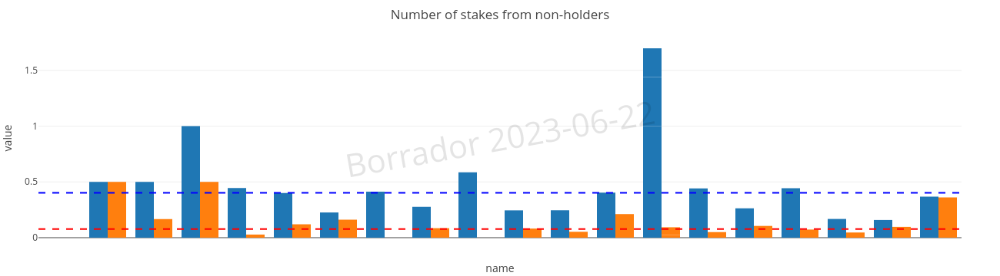

In [12]:
_plot = dfd.set_index('name').sort_values('cntActivity')[['internalDAOpct', 'internalPlatformpct']].dropna()
_plot['Outside DAO'] = 1 - _plot['internalDAOpct']
_plot['Outside Platform'] = 1 - _plot['internalPlatformpct']
_plot = _plot[['Outside DAO', 'Outside Platform']]

display(_plot.describe().transpose())

display(_plot.describe()['Outside DAO']['mean'])

fig = px.bar(_plot, barmode='group', title='Number of stakes from non-holders')
fig.add_hline(y=_plot.describe()['Outside DAO']['50%'], line_color='blue', line_dash='dash')
fig.add_hline(y=_plot.describe()['Outside Platform']['50%'], line_color='red', line_dash='dash')

In [13]:
dfd.columns

Index(['id', 'name', 'register', 'nativeToken', 'nativeReputation', 'nusers',
       'hnusers', 'firstUser', 'firstActivity', 'lastActivity', 'lastVote',
       'cntActivity', 'nvotes', 'nstakes', 'nproposals',
       'monthsSinceFirstUser', 'monthSinceFirstActivity',
       'monthsSinceLastActivity', 'monthsWithActivity', 'monthsWithProposals',
       'pctActive', 'pctApproved', 'pctBoosted', 'pctStaked', 'vpp', 'spp',
       'TP', 'TN', 'FP', 'FN', 'precision', 'precision_boosted',
       'precision_nonboosted', 'nvoters', 'nproposers', 'shortid', 'group',
       'internalDAOcnt', 'internalPlatformcnt', 'internalDAOpct',
       'internalPlatformpct'],
      dtype='object')

### Ampliar tabla anterior con ponderaciones

In [14]:
dfs['internalDAOAmount'] = dfs['internalDAO'] * dfs['amount']
dfs['internalPlatformAmount'] = dfs['internalPlatform'] * dfs['amount']

dfsgby = dfs.groupby(['network', 'dao'])
dfd['totalStaked'] = dfsgby['amount'].sum()
dfd['internalDAOAmount'] = dfsgby['internalDAOAmount'].sum()
dfd['internalDAOAmountpct'] = dfd['internalDAOAmount'] / dfd['totalStaked']
dfd['internalPlatformAmount'] = dfsgby['internalPlatformAmount'].sum()
dfd['internalPlatformAmountpct'] = dfd['internalPlatformAmount'] / dfd['totalStaked']

total_amount = dfs['amount'].sum()
amount_out_d = 100 - (dfs['internalDAOAmount'].sum() / total_amount * 100)
amount_out_p = 100 - (dfs['internalPlatformAmount'].sum() / total_amount * 100)

print(f"{amount_out_d:.2f}% of the GEN comes from users outside the DAO")
print(f"{amount_out_p:.2f}% of the GEN comes from users without a DAO")

dfd[['name', 'hnusers', 'cntActivity', 'nproposals', 'nstakes', 'internalDAOAmount', 'internalDAOAmountpct', 'internalPlatformAmount', 'internalPlatformAmountpct']].dropna().sort_values('nproposals')

9.81% of the GEN comes from users outside the DAO
1.68% of the GEN comes from users without a DAO


name  \
network dao                                                                   
mainnet 0x39757e7cdb7022c3829195d57b29428d79593c9d      Trips Community DAO   
xdai    0x2b0f5e7de201068d9fb917ab86dc1c731c274411             DAOstack DAO   
mainnet 0x3324b516df92e78463d8b0616dd146cf6c58b0b9                   efxDAO   
        0x2b8c70fffda7f3d7667f7cfede1429313886329c                ETHGlobal   
        0xee7fa430a7e513d3df962ed0c0e285bc6f87fc24      CENNZnet Grants DAO   
xdai    0xe248a76a4a84667c859eb51b9af6dea29e52f139                 BuffiDAO   
mainnet 0x70c36947837b43665ed5ea85c112aa0f72cf9fb3  Psychedelic Society DAO   
        0x61151f7ef32c920794ed89b2545f1672266d6420    The General Store DAO   
        0x273d0f686a53a49a0fba2a801566b19f9aaf8fcd                 PrimeDAO   
        0xafdd1eb2511cd891acf2bff82dabf47e0c914d24                      1UP   
        0xe56b4d8d42b1c9ea7dda8a6950e3699755943de7                   necDAO   
        0xd358d4f159e6fae32d1b6096bdace829a5fe33fb                     dOrg   
        0x0b93ba560283350d4216f29dc57e15df38d0eace                  CuraDAO   
        0xe8e1d0f1783b22ff409deb14fa5acc9cce2a3d15                  DAOfund   
        0x6bee9b81e434f7afce72a43a4016719315069539          Kyber DAO Exp#2   
        0x440583455bcd85ab2bd429c015d3aabcae135f0a                 PolkaDAO   
        0x8990e11b69403ea53ef2b32434bbd7dbf84b5234                  FestDAO   
        0x15344ecdc2c4edfcb092e284d93c20f0529fd8a6                     dOrg   
        0xbe1a98d3452f6da6e0984589e545d4fc25af7526                     dOrg   
        0x294f999356ed03347c7a23bcbcf8d33fa41dc830            Genesis Alpha   
        0x519b70055af55a007110b4ff99b0ea33071c720a                    dxDAO   
xdai    0xe716ec63c5673b3a4732d22909b38d779fa47c3f                   xDXdao   

                                                    hnusers  cntActivity  \
network dao                                                                
mainnet 0x39757e7cdb7022c3829195d57b29428d79593c9d      7.0           11   
xdai    0x2b0f5e7de201068d9fb917ab86dc1c731c274411      6.0           30   
mainnet 0x3324b516df92e78463d8b0616dd146cf6c58b0b9     26.0           89   
        0x2b8c70fffda7f3d7667f7cfede1429313886329c     48.0          142   
        0xee7fa430a7e513d3df962ed0c0e285bc6f87fc24     12.0           87   
xdai    0xe248a76a4a84667c859eb51b9af6dea29e52f139   2830.0           44   
mainnet 0x70c36947837b43665ed5ea85c112aa0f72cf9fb3     17.0           39   
        0x61151f7ef32c920794ed89b2545f1672266d6420     10.0          102   
        0x273d0f686a53a49a0fba2a801566b19f9aaf8fcd     95.0           98   
        0xafdd1eb2511cd891acf2bff82dabf47e0c914d24     14.0          120   
        0xe56b4d8d42b1c9ea7dda8a6950e3699755943de7    140.0          232   
        0xd358d4f159e6fae32d1b6096bdace829a5fe33fb     22.0          258   
        0x0b93ba560283350d4216f29dc57e15df38d0eace     55.0          209   
        0xe8e1d0f1783b22ff409deb14fa5acc9cce2a3d15      8.0          138   
        0x6bee9b81e434f7afce72a43a4016719315069539   4946.0          340   
        0x440583455bcd85ab2bd429c015d3aabcae135f0a     74.0          419   
        0x8990e11b69403ea53ef2b32434bbd7dbf84b5234     39.0          338   
        0x15344ecdc2c4edfcb092e284d93c20f0529fd8a6     31.0          545   
        0xbe1a98d3452f6da6e0984589e545d4fc25af7526     25.0         1218   
        0x294f999356ed03347c7a23bcbcf8d33fa41dc830    268.0         3669   
        0x519b70055af55a007110b4ff99b0ea33071c720a    489.0         4681   
xdai    0xe716ec63c5673b3a4732d22909b38d779fa47c3f    402.0         9342   

                                                    nproposals  nstakes  \
network dao                                                               
mainnet 0x39757e7cdb7022c3829195d57b29428d79593c9d           6        1   
xdai    0x2b0f5e7de201068d9fb917ab86dc1c731c274411          13        2   
mainnet 0x3324b516df92e78463d8b0616dd146cf6c58b0b

,count,mean,std,min,25%,50%,75%,max
Outside DAO,22.0,0.468058,0.324008,0.000000,0.221602,0.425518,0.737110,1.000000
Outside Platform,22.0,0.049179,0.096795,-0.010949,0.000000,0.000971,0.041107,0.397204


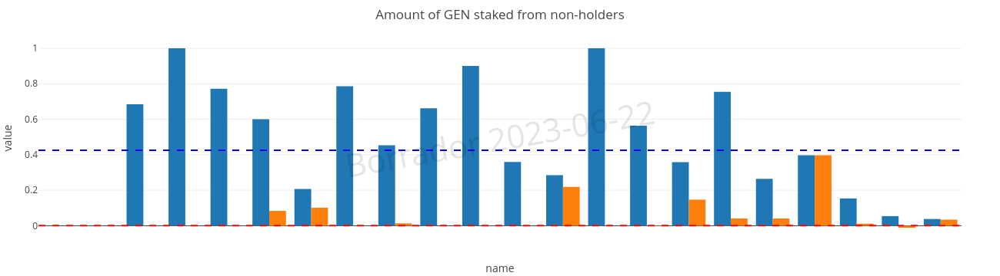

In [15]:
_plot = utils.change_unregistered_names(dfd.reset_index()).set_index('name').sort_values('cntActivity')[['internalDAOAmountpct', 'internalPlatformAmountpct']].dropna()
_plot['Outside DAO'] = 1 - _plot['internalDAOAmountpct']
_plot['Outside Platform'] = 1 - _plot['internalPlatformAmountpct']
_plot = _plot[['Outside DAO', 'Outside Platform']]

display(_plot.describe().transpose())

fig = px.bar(_plot, barmode='group', title='Amount of GEN staked from non-holders')
fig.add_hline(y=_plot.describe()['Outside DAO']['50%'], line_color='blue', line_dash='dash')
fig.add_hline(y=_plot.describe()['Outside Platform']['50%'], line_color='red', line_dash='dash')

### Ahora diferenciando entre upstake y downstake

In [16]:
dfs['internalDAOAmount'] = dfs['internalDAO'] * dfs['amount']
dfs['internalPlatformAmount'] = dfs['internalPlatform'] * dfs['amount']

ups = dfs[dfs['amount'] > 0]
downs = dfs[dfs['amount'] < 0]

total_upstake = ups['amount'].sum()
ups_amount_out_d = 100 - (ups['internalDAOAmount'].sum() / total_upstake * 100)
ups_amount_out_p = 100 - (ups['internalPlatformAmount'].sum() / total_upstake * 100)

print(f"{ups_amount_out_d:.2f}% of the upstake GEN comes from users outside the DAO")
print(f"{ups_amount_out_p:.2f}% of the upstake GEN comes from users without a DAO")

total_downstake = downs['amount'].sum()
downs_amount_out_d = 100 - (downs['internalDAOAmount'].sum() / total_downstake * 100)
downs_amount_out_p = 100 - (downs['internalPlatformAmount'].sum() / total_downstake * 100)

print(f"{downs_amount_out_d:.2f}% of the downstake GEN comes from users outside the DAO")
print(f"{downs_amount_out_p:.2f}% of the downstake GEN comes from users without a DAO")

dfd['upstake'] = ups.groupby(['network', 'dao'])['amount'].sum()
dfd['upstake'] = dfd['upstake'].fillna(0)
dfd['internalUpstake'] = ups.groupby(['network', 'dao'])['internalDAOAmount'].sum()
dfd['internalUpstake'] = dfd['internalUpstake'].fillna(0)

dfd['downstake'] = downs.groupby(['network', 'dao'])['amount'].sum()
dfd['downstake'] = dfd['downstake'].fillna(0)
dfd['internalDownstake'] = downs.groupby(['network', 'dao'])['internalDAOAmount'].sum()
dfd['internalDownstake'] = dfd['internalDownstake'].fillna(-0.0)

dfds = utils.change_unregistered_names(dfd.reset_index()).copy()
%pickledf dfds

dfds = utils.tables.add_pct_col(dfds, 'internalUpstake', 'upstake')
dfds = utils.tables.add_pct_col(dfds, 'internalDownstake', 'downstake')
dfds[['name', 'cntActivity', 'nproposals', 'nstakes', 'upstake', 'internalUpstake (pct)', 'downstake', 'internalDownstake (pct)']].dropna()

11.72% of the upstake GEN comes from users outside the DAO
3.86% of the upstake GEN comes from users without a DAO
30.54% of the downstake GEN comes from users outside the DAO
25.27% of the downstake GEN comes from users without a DAO
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 53 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   network                    92 non-null     object        
 1   dao                        92 non-null     object        
 2   id                         92 non-null     object        
 3   name                       92 non-null     object        
 4   register                   92 non-null     object        
 5   nativeToken                92 non-null     object        
 6   nativeReputation           92 non-null     object        
 7   nusers                     92 non-null     int64         
 8   hnusers                    

,name,cntActivity,nproposals,nstakes,upstake,internalUpstake (pct),downstake,internalDownstake (pct)
0,CuraDAO,209,49,57,8912.00000,5712 (64%),0.00,–
1,dOrg,545,127,82,243.73000,179 (74%),0.00,–
2,PrimeDAO,98,37,31,2365.00000,1875 (79%),0.00,–
3,Genesis Alpha,3669,387,1079,311482.06601,262237 (84%),-52598.92,-43227 (82%)
4,ETHGlobal,142,19,49,11372.28000,4622 (41%),-3874.27,-3874 (100%)
...,...,...,...,...,...,...,...,...
87,Redolent Banjo (unregistered),0,0,0,0.00000,–,0.00,–
88,Unilogin,9,3,0,0.00000,–,0.00,–
89,Spasmodic Salad (unregistered),4,4,0,0.00000,–,0.00,–
90,UX Awards DAO (unregistered 0xfb90),0,0,0,0.00000,–,0.00,–


## Nº de DAOs que han recibido algo de stake externo

In [17]:
dfd[~(dfd['internalDAOpct'] < 1.0)]

id  \
network dao                                                                                      
mainnet 0x39757e7cdb7022c3829195d57b29428d79593c9d  0x39757e7cdb7022c3829195d57b29428d79593c9d   
        0x45cf7d5c503b6417d570929368b8f4c4567ad9eb  0x45cf7d5c503b6417d570929368b8f4c4567ad9eb   
        0x5f667f138d6c5559a0966c241c867feeaea4c28c  0x5f667f138d6c5559a0966c241c867feeaea4c28c   
        0x6191cb94a29a3ca870adea25cd72e995303c2848  0x6191cb94a29a3ca870adea25cd72e995303c2848   
        0x63df13b12bac071ba31b6599b8d97c82cb96a768  0x63df13b12bac071ba31b6599b8d97c82cb96a768   
...                                                                                        ...   
xdai    0xf3762a867f6ef7538101fa8ea86870d29b6d7cde  0xf3762a867f6ef7538101fa8ea86870d29b6d7cde   
        0xf902172bd2f34a6cf86d424f0440836d2d89afeb  0xf902172bd2f34a6cf86d424f0440836d2d89afeb   
        0xfa19f292b400579794e2e3cc0d4b6559482b9d94  0xfa19f292b400579794e2e3cc0d4b6559482b9d94   
        0xfb900830991dd238b78a1704ec9dc41e39da49bc  0xfb900830991dd238b78a1704ec9dc41e39da49bc   
        0xfd4a08ba1863718d92467ad05f13b352c3ae2cfd  0xfd4a08ba1863718d92467ad05f13b352c3ae2cfd   

                                                                   name  \
network dao                                                               
mainnet 0x39757e7cdb7022c3829195d57b29428d79593c9d  Trips Community DAO   
        0x45cf7d5c503b6417d570929368b8f4c4567ad9eb             BuffiDAO   
        0x5f667f138d6c5559a0966c241c867feeaea4c28c          HackerDAO A   
        0x6191cb94a29a3ca870adea25cd72e995303c2848        Fortmatic DAO   
        0x63df13b12bac071ba31b6599b8d97c82cb96a768       The Illuminati   
...                                                                 ...   
xdai    0xf3762a867f6ef7538101fa8ea86870d29b6d7cde       Redolent Banjo   
        0xf902172bd2f34a6cf86d424f0440836d2d89afeb             Unilogin   
        0xfa19f292b400579794e2e3cc0d4b6559482b9d94      Spasmodic Salad   
        0xfb900830991dd238b78a1704ec9dc41e39da49bc        UX Awards DAO   
        0xfd4a08ba1863718d92467ad05f13b352c3ae2cfd         Arbitrum DAO   

                                                        register  \
network dao                                                        
mainnet 0x39757e7cdb7022c3829195d57b29428d79593c9d    registered   
        0x45cf7d5c503b6417d570929368b8f4c4567ad9eb    registered   
        0x5f667f138d6c5559a0966c241c867feeaea4c28c    registered   
        0x6191cb94a29a3ca870adea25cd72e995303c2848    registered   
        0x63df13b12bac071ba31b6599b8d97c82cb96a768    registered   
...                                                          ...   
xdai    0xf3762a867f6ef7538101fa8ea86870d29b6d7cde  unRegistered   
        0xf902172bd2f34a6cf86d424f0440836d2d89afeb    registered   
        0xfa19f292b400579794e2e3cc0d4b6559482b9d94  unRegistered   
        0xfb900830991dd238b78a1704ec9dc41e39da49bc  unRegistered   
        0xfd4a08ba1863718d92467ad05f13b352c3ae2cfd    registered   

                                                                                   nativeToken  \
network dao                                                                                      
mainnet 0x39757e7cdb7022c3829195d57b29428d79593c9d  0xb8aeb358df2de578cba12f73fae16064102eb180   
        0x45cf7d5c503b6417d570929368b8f4c4567ad9eb  0x62bb92a45e4132449cab13670d858d9320b3f9df   
        0x5f667f138d6c5559a0966c241c867feeaea4c28c  0x793543ad25ed9d3a37adbed6d6fcd713adb49f2c   
        0x6191cb94a29a3ca870adea25cd72e995303c2848  0x399990c46dc242f7af9e6562a6c2d77758817318   
        0x63df13b12bac071ba31b6599b8d97c82cb96a768  0x94cba4d4162edb9a23f970bbf44abe6da835a6c4   
...                                                                                        ...   
xdai    0xf3762a867f6ef7538101fa8ea86870d29b6d7cde  0xc23e495e07c2dd89b79240e608c239da84732788   
        0xf902172bd2f34a6cf86d424f0440836d2d89afeb  0xed42532652ba4603cb61

## Q: ¿Stakean más los outsiders?

- [x] Hacer un plot con la cantidad media stakeada por propuesta por los insiders/outsiders -> catplot

Usamos `kind=bar` porque resulta que hay mucho outlier, y se nos va el gráfico de escala

In [26]:
dfs

,network,id,createdAt,staker,outcome,amount,dao,proposal,createdAtMonth,daoRegister,daoName,internalPlatform,internalDAO,isProposer,isVoter,group,name,register,internalDAOAmount,internalPlatformAmount
0,mainnet,0x002a6f4b1986b3d700b470bdcd835a5c828e8e9cb04d...,2019-06-21 20:02:25,0x26904e77a65ba7ff95803d804ef46fc6d8f33720,Pass,60.000,0x6bee9b81e434f7afce72a43a4016719315069539,0x1d7514de86913f1f306c237d2f6c88ac31098afb00cd...,2019-06,registered,Kyber DAO Exp#2,True,True,True,True,Kyber DAO Exp#2,Kyber DAO Exp#2,registered,60.000,60.000
1,mainnet,0x0034e58174fdef6f34fa3df9e4582297a74e0481d200...,2019-07-29 03:16:15,0x4abe45a46ff4be05545684ab7aa1894628d9dca6,Pass,1.000,0x519b70055af55a007110b4ff99b0ea33071c720a,0xa0225277f6b1f3b4f0bedc3e4d92ed8f3ba53e584781...,2019-07,registered,Kyber DAO Exp#2,False,False,False,False,dxDAO,dxDAO,registered,0.000,0.000
2,mainnet,0x003855e34d7163f25f7b3abf4c8584414cf1dd3cf18c...,2019-04-22 18:52:45,0xf16294a979a027f297dace2f618cb57bc4bf5d16,Pass,150.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0xf37c69b6340e07c14ec9a9cac73a04682d5987d183f8...,2019-04,registered,Kyber DAO Exp#2,True,True,False,True,Genesis Alpha,Genesis Alpha,registered,150.000,150.000
3,mainnet,0x004d8429b916138dfc1386b71922a9efe28c5e507eb1...,2019-04-21 14:26:21,0xce7298e5ef1ae8af0573edc2ebd03ab0f837e214,Pass,300.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0x9421968a79dfc6b9437c04810293ff7f732fed2190ba...,2019-04,registered,Kyber DAO Exp#2,True,True,False,True,Genesis Alpha,Genesis Alpha,registered,300.000,300.000
4,mainnet,0x006812f41b36c70bc1403953407457b165f07b666d5d...,2019-08-05 19:01:08,0xa15ca74e65bf72730811abf95163e89ad9b9dff6,Fail,-100.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0x7fd26b2118068bd2e38e62d0b833fe49962db9e2ebaa...,2019-08,registered,Kyber DAO Exp#2,True,True,False,False,Genesis Alpha,Genesis Alpha,registered,-100.000,-100.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5105,xdai,0xa576432220fc166f51106bb1f0a8aab6b445f2281fc6...,2021-05-07 19:15:10,0xe16d3664b313bd5fb8d911b467047e3cb4ed853d,Pass,2200.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0x77635c47f54eeec7b3de249d60a9743aa5680edea8e8...,2021-05,registered,xDXdao,True,True,False,True,dxDAO,xDXdao,registered,2200.000,2200.000
5106,xdai,0xffdb827722dd27c4b13969d2933acb50cf4c119a1d18...,2022-06-15 16:24:05,0x1861974f32eacdcced0f81b0f8eccfed58153a9d,Pass,1500.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0xc7d58c37c58f7ec8557e8f6c78bf84afdc9eb14f5ec8...,2022-06,registered,BuffiDAO,True,True,False,False,dxDAO,xDXdao,registered,1500.000,1500.000
5107,xdai,0xffe1f6b2cc50ac2b4b61cff94ef25edba7734d38d3e2...,2022-03-12 01:58:25,0xbc3a058d1c919f6b1f48e8846246d04d467902c8,Pass,5.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0x122f3766bca165927f6696f2bed943198ca8a0f2f2ef...,2022-03,registered,BuffiDAO,True,True,False,True,dxDAO,xDXdao,registered,5.000,5.000
5108,xdai,0xffeb73bee7bb025e08acbb289ce4f7fbf1d20e79de0e...,2021-05-09 01:17:20,0x40a57a5d9b618b9a49307b530736b4f51e008741,Pass,0.010,0x94a587478c83491b13291265581cb983e7feb540,0x640e8a29be9b04dfd7fc12d11abddb0f42f312961549...,2021-05,registered,DAOstack DAO,True,True,False,True,NaN,NaN,NaN,0.010,0.010


,count,mean,std,min,25%,50%,75%,max
internalDAO,,,,,,,,
False,627.0,577.943177,1174.641986,1.000000e-03,100.0,300.0,1000.0,20000.0
True,4483.0,526.239509,810.174212,6.000000e-16,50.0,300.0,716.7,20000.0


<AxesSubplot: xlabel='internalDAO', ylabel='absAmount'>

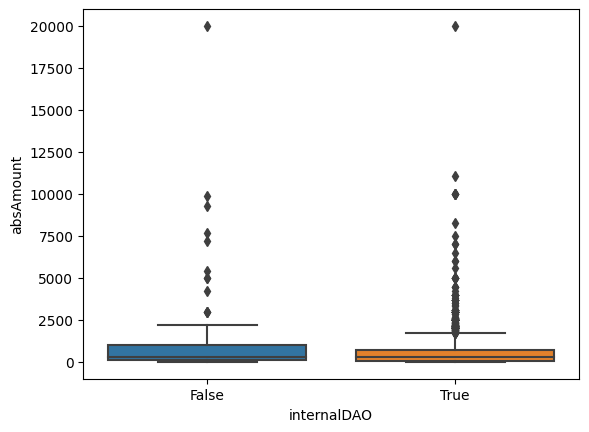

In [33]:
dfs['absAmount'] = dfs['amount'].abs()

display(dfs.groupby('internalDAO')['absAmount'].describe())

sns.boxplot(data=dfs, x='internalDAO', y='absAmount')

### ¿upstake/downstake outsiders/insiders?

<AxesSubplot: xlabel='isUpstake', ylabel='internalDAO'>

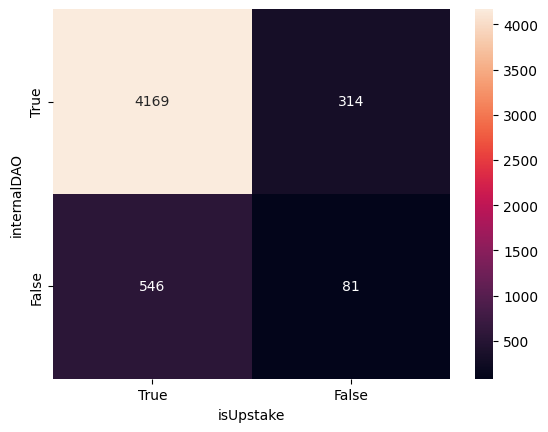

In [53]:
dfs['isUpstake'] = dfs['amount'] > 0
sns.heatmap(
    dfs.value_counts(['internalDAO', 'isUpstake']).unstack().sort_index(ascending=False).sort_index(axis=1, ascending=False),
    annot=True,
    fmt="d",
)

In [85]:
_dfs = dfs.copy()
bool_cols = _dfs.select_dtypes(include=bool).columns.tolist()
_dfs[bool_cols] = _dfs[bool_cols].astype(int)
print(_dfs.select_dtypes(include=[int, float]).columns)

with pd.option_context('display.float_format', lambda x: '{:.3f}'.format(x)):
    display(_dfs[['internalDAO', 'absAmount', 'isProposer', 'isVoter', 'isUpstake']].groupby('internalDAO').describe().T)

Index(['amount', 'internalPlatform', 'internalDAO', 'isProposer', 'isVoter',
       'internalDAOAmount', 'internalPlatformAmount', 'absAmount',
       'isUpstake'],
      dtype='object')


internalDAO              0         1
absAmount  count   627.000  4483.000
           mean    577.943   526.240
           std    1174.642   810.174
           min       0.001     0.000
           25%     100.000    50.000
           50%     300.000   300.000
           75%    1000.000   716.700
           max   20000.000 20000.000
isProposer count   627.000  4483.000
           mean      0.069     0.369
           std       0.253     0.483
           min       0.000     0.000
           25%       0.000     0.000
           50%       0.000     0.000
           75%       0.000     1.000
           max       1.000     1.000
isVoter    count   627.000  4483.000
           mean      0.000     0.626
           std       0.000     0.484
           min       0.000     0.000
           25%       0.000     0.000
           50%       0.000     1.000
           75%       0.000     1.000
           max       0.000     1.000
isUpstake  count   627.000  4483.000
           mean      0.871     0.930
           std       0.336     0.255
           min       0.000     0.000
           25%       1.000     1.000
           50%       1.000     1.000
           75%       1.000     1.000
           max       1.000     1.000

Parece ser que están por un estilo...

### Por cada DAO

In [19]:
display(dfs)

,network,id,createdAt,staker,outcome,amount,dao,proposal,createdAtMonth,daoRegister,daoName,internalPlatform,internalDAO,isProposer,isVoter,group,name,register,internalDAOAmount,internalPlatformAmount
0,mainnet,0x002a6f4b1986b3d700b470bdcd835a5c828e8e9cb04d...,2019-06-21 20:02:25,0x26904e77a65ba7ff95803d804ef46fc6d8f33720,Pass,60.000,0x6bee9b81e434f7afce72a43a4016719315069539,0x1d7514de86913f1f306c237d2f6c88ac31098afb00cd...,2019-06,registered,Kyber DAO Exp#2,True,True,True,True,Kyber DAO Exp#2,Kyber DAO Exp#2,registered,60.000,60.000
1,mainnet,0x0034e58174fdef6f34fa3df9e4582297a74e0481d200...,2019-07-29 03:16:15,0x4abe45a46ff4be05545684ab7aa1894628d9dca6,Pass,1.000,0x519b70055af55a007110b4ff99b0ea33071c720a,0xa0225277f6b1f3b4f0bedc3e4d92ed8f3ba53e584781...,2019-07,registered,Kyber DAO Exp#2,False,False,False,False,dxDAO,dxDAO,registered,0.000,0.000
2,mainnet,0x003855e34d7163f25f7b3abf4c8584414cf1dd3cf18c...,2019-04-22 18:52:45,0xf16294a979a027f297dace2f618cb57bc4bf5d16,Pass,150.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0xf37c69b6340e07c14ec9a9cac73a04682d5987d183f8...,2019-04,registered,Kyber DAO Exp#2,True,True,False,True,Genesis Alpha,Genesis Alpha,registered,150.000,150.000
3,mainnet,0x004d8429b916138dfc1386b71922a9efe28c5e507eb1...,2019-04-21 14:26:21,0xce7298e5ef1ae8af0573edc2ebd03ab0f837e214,Pass,300.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0x9421968a79dfc6b9437c04810293ff7f732fed2190ba...,2019-04,registered,Kyber DAO Exp#2,True,True,False,True,Genesis Alpha,Genesis Alpha,registered,300.000,300.000
4,mainnet,0x006812f41b36c70bc1403953407457b165f07b666d5d...,2019-08-05 19:01:08,0xa15ca74e65bf72730811abf95163e89ad9b9dff6,Fail,-100.000,0x294f999356ed03347c7a23bcbcf8d33fa41dc830,0x7fd26b2118068bd2e38e62d0b833fe49962db9e2ebaa...,2019-08,registered,Kyber DAO Exp#2,True,True,False,False,Genesis Alpha,Genesis Alpha,registered,-100.000,-100.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5105,xdai,0xa576432220fc166f51106bb1f0a8aab6b445f2281fc6...,2021-05-07 19:15:10,0xe16d3664b313bd5fb8d911b467047e3cb4ed853d,Pass,2200.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0x77635c47f54eeec7b3de249d60a9743aa5680edea8e8...,2021-05,registered,xDXdao,True,True,False,True,dxDAO,xDXdao,registered,2200.000,2200.000
5106,xdai,0xffdb827722dd27c4b13969d2933acb50cf4c119a1d18...,2022-06-15 16:24:05,0x1861974f32eacdcced0f81b0f8eccfed58153a9d,Pass,1500.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0xc7d58c37c58f7ec8557e8f6c78bf84afdc9eb14f5ec8...,2022-06,registered,BuffiDAO,True,True,False,False,dxDAO,xDXdao,registered,1500.000,1500.000
5107,xdai,0xffe1f6b2cc50ac2b4b61cff94ef25edba7734d38d3e2...,2022-03-12 01:58:25,0xbc3a058d1c919f6b1f48e8846246d04d467902c8,Pass,5.000,0xe716ec63c5673b3a4732d22909b38d779fa47c3f,0x122f3766bca165927f6696f2bed943198ca8a0f2f2ef...,2022-03,registered,BuffiDAO,True,True,False,True,dxDAO,xDXdao,registered,5.000,5.000
5108,xdai,0xffeb73bee7bb025e08acbb289ce4f7fbf1d20e79de0e...,2021-05-09 01:17:20,0x40a57a5d9b618b9a49307b530736b4f51e008741,Pass,0.010,0x94a587478c83491b13291265581cb983e7feb540,0x640e8a29be9b04dfd7fc12d11abddb0f42f312961549...,2021-05,registered,DAOstack DAO,True,True,False,True,NaN,NaN,NaN,0.010,0.010


In [105]:
# Quitamos las errorbars porque nuestro dataset no es muy grande y nos fastidia los gráficos
ESTIMATOR = 'median' # instead of 'mean'
Y = 'group'
_toplot = dfs[dfs.daoRegister == 'registered'].dropna()
# plot_order = dfd[dfd.group.isin(_toplot.group)].sort_values('cntActivity').group

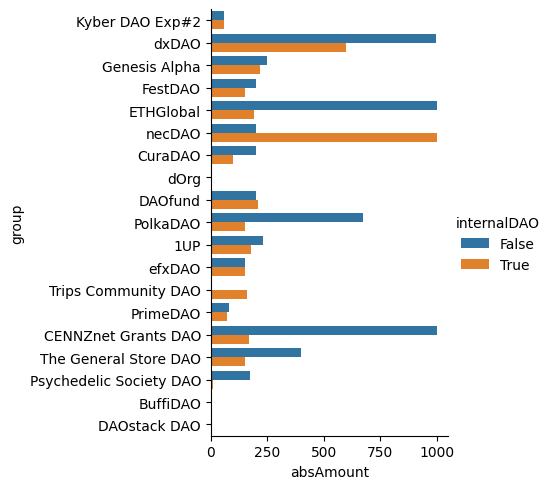

In [108]:
sns.catplot(data=_toplot, x='absAmount', y=Y, kind='bar', hue='internalDAO', errorbar=None, estimator=ESTIMATOR);

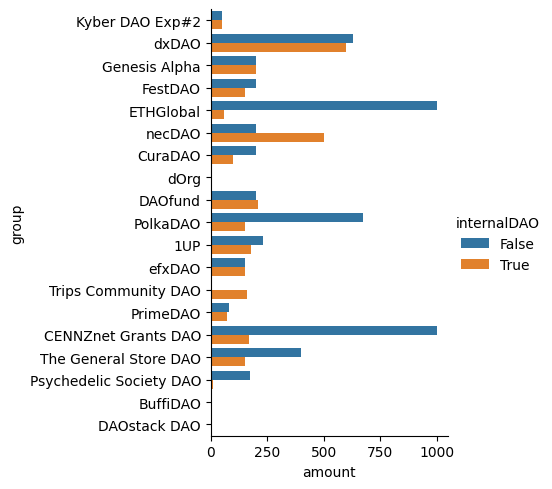

In [109]:
sns.catplot(data=_toplot, x='amount', y=Y, kind='bar', hue='internalDAO', errorbar=None, estimator=ESTIMATOR);

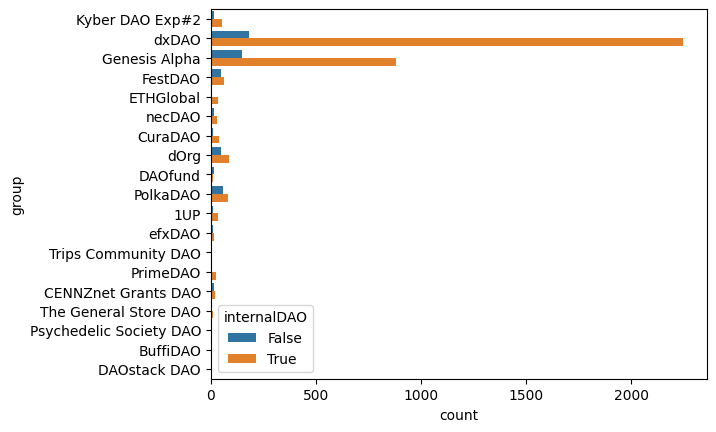

In [116]:
sns.countplot(data=_toplot, y=Y, hue='internalDAO');

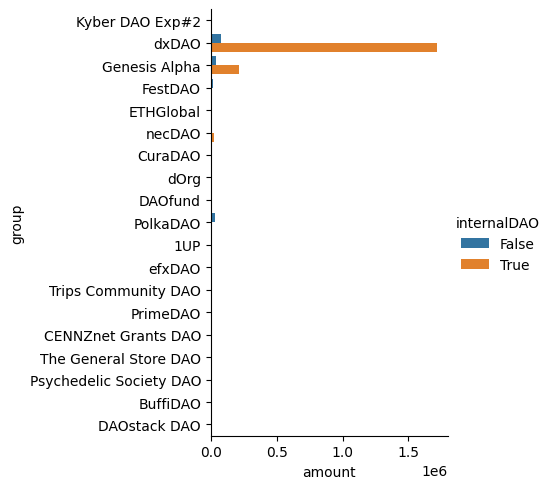

In [111]:
sns.catplot(data=_toplot, x='amount', y=Y, kind='bar', hue='internalDAO', errorbar=None, estimator='sum');

Aunque en las estadísticas globales podíamos comprobar que la cantidad stakeada se mantenía relativamente igual, aquí podemos ver que el comportamiento es muy distinto dependiendo de la DAO. Teniendo en cuenta las que más actividad han tenido...

- En dOrg, sus internos apuestan más que los outsiders
- Genesis Alpha, dxDAO y PolkaDAO tienen empate
- xDXdao, sin embargo, si que parece que los outsiders apuestan más
- En KyberDAO, los insiders apuestan muy poco. Esto puede ser debido a que es una DAO creada para un hackathlon, y la gente que apueste de fuera tendrá más GEN por haber participado en otras DAOs anteriormente. El otro gráfico (internalPlatform) nos da la razón, pues la gente de fuera de DAOstack stakea cantidades muy bajas.

<AxesSubplot: xlabel='cntActivity', ylabel='name'>

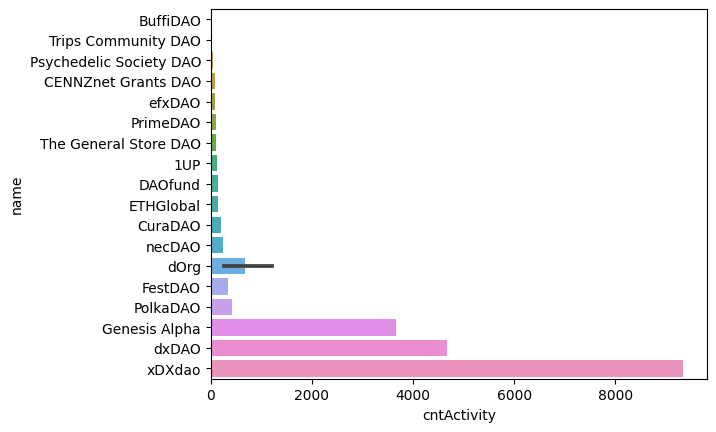

In [110]:
sns.barplot(data=dfd[dfd.name.isin(_toplot.daoName) & (dfd.hnusers < 1000)].sort_values('cntActivity'), x='cntActivity', y='name')

## Staking interno/externo a lo largo del tiempo

### Cantidad Absoluta

Mostramos la cantidad total de GEN stakeado por insiders / outsiders a lo largo del tiempo

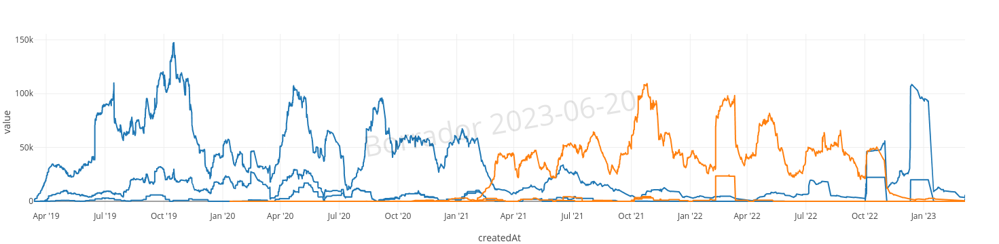

In [24]:
# TODO: Arreglar esto (poner dos gráficos, uno de mainnet y otro de xdai)

WINDOW_SIZE = '30d'

dfs['absAmount'] = abs(dfs['amount'])
dfs['externalDAOAmount'] = ~dfs['internalDAO'] * dfs['absAmount']
dfs['externalPlatformAmount'] = ~dfs['internalPlatform'] * dfs['absAmount']

_df = dfs.set_index(['network', 'createdAt']).sort_index()
_dfr = _df.groupby(level='network').apply(lambda x: x.reset_index(level='network').rolling(WINDOW_SIZE)[['absAmount', 'externalPlatformAmount', 'externalDAOAmount']].sum())

_dfr_n = _dfr.reset_index(level='network')
# display(_dfr_n)
# for c in _dfr.columns():
#     fig = px.line(_dfr_n, y=c, color='network')
px.line(_dfr.reset_index(level='network'), y=['absAmount', 'externalDAOAmount', 'externalPlatformAmount'], color='network')

### Cantidad Relativa

Porcentaje de gen stakeado por insiders / outsiders a lo largo del tiempo

saving to ../logseq/assets/nb_figures/stakers/pct_staked_insiders_outsiders.png
Use ![Porcentaje de GEN stakeado por insiders/outsiders a lo largo del tiempo 30d](../assets/nb_figures/stakers/pct_staked_insiders_outsiders.png) to embed it in logseq


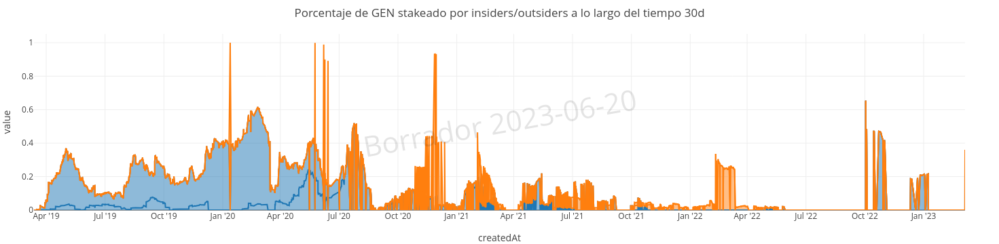

In [25]:
_df = dfs.set_index(['network', 'createdAt']).sort_index()
_dfr = _df.groupby(level='network').apply(lambda x: x.reset_index(level='network').rolling(WINDOW_SIZE)[['absAmount', 'externalPlatformAmount', 'externalDAOAmount']].sum())

for c in _dfr.columns:
    _dfr[c+'Pct'] = abs(_dfr[c]) / _dfr['absAmount']
    
# Area plot already makes the sum
_dfr['externalDAOAmountPct'] -= _dfr['externalPlatformAmountPct']
    
fig = px.area(_dfr.reset_index(level='network'), y=['externalPlatformAmountPct', 'externalDAOAmountPct'], color='network', title=f"Porcentaje de GEN stakeado por insiders/outsiders a lo largo del tiempo {WINDOW_SIZE}")
utils.plot.save_fig(fig, 'stakers/pct_staked_insiders_outsiders.png')

En xdai casi no ha habido staking de gente de fuera de DAOstack, excepto en un pico en Marzo 2022, en los que llegó al 20%. En marzo 2021 comienza a notarse la actividad en daostack xdai.

En mainnet sí que hay más staking de gente de fuera de la DAO, pero hasta junio 2020 a penas había staking de fuera de la plataforma. A partir de esta fecha, se puede notar que casi todo el staking es de fuera de la plataforma, llegando a un gran pico en Agosto 2020 con un 50% de staking externo, que coincide con un pico en el precio del GEN.

Sin embargo, sí que había bastante staking de fuera de la DAO pero dentro del ecosistema, llegando a superar el 50% en marzo 2020

### Número de acciones

/tmp/ipykernel_3757/1535703643.py:3: FutureWarning:

Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['network'], dtype='object')

/tmp/ipykernel_3757/1535703643.py:3: FutureWarning:

Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['network'], dtype='object')



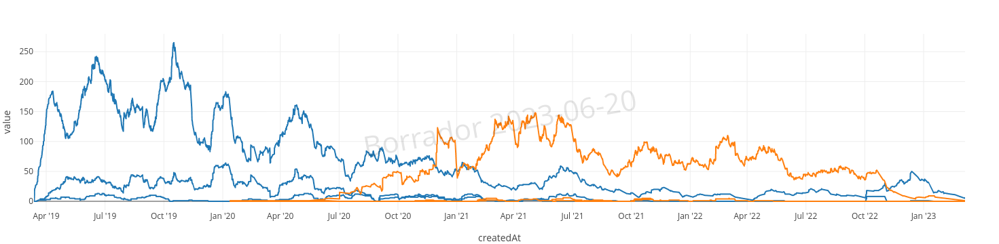

In [26]:
_df = dfs.set_index(['network', 'createdAt']).sort_index()
_df = _df[['amount', 'externalPlatformAmount', 'externalDAOAmount']].astype(bool)
_dfr = _df.groupby(level='network').apply(lambda x: x.reset_index(level='network').rolling(WINDOW_SIZE).sum())    
px.line(_dfr.reset_index(level='network'), y=['amount', 'externalPlatformAmount', 'externalDAOAmount'], color='network')

## ¿Cuanto stakea el staker medio?

In [27]:
dfs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5110 entries, 0 to 5109
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   network                 5110 non-null   object        
 1   id                      5110 non-null   object        
 2   createdAt               5110 non-null   datetime64[ns]
 3   staker                  5110 non-null   object        
 4   outcome                 5110 non-null   object        
 5   amount                  5110 non-null   float64       
 6   dao                     5110 non-null   object        
 7   proposal                5110 non-null   object        
 8   createdAtMonth          5110 non-null   period[M]     
 9   daoRegister             5110 non-null   object        
 10  daoName                 5110 non-null   object        
 11  internalPlatform        5110 non-null   bool          
 12  internalDAO             5110 non-null   bool    

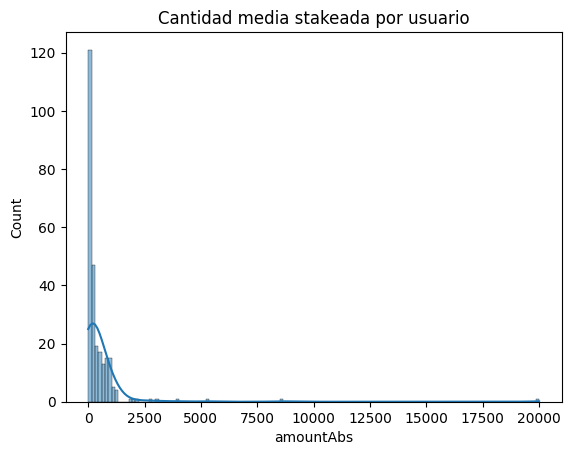

In [28]:
dfs['amountAbs'] = dfs['amount'].abs()
_toplot = dfs.groupby('staker')['amountAbs'].mean()
sns.histplot(_toplot, kde=True).set(title="Cantidad media stakeada por usuario");

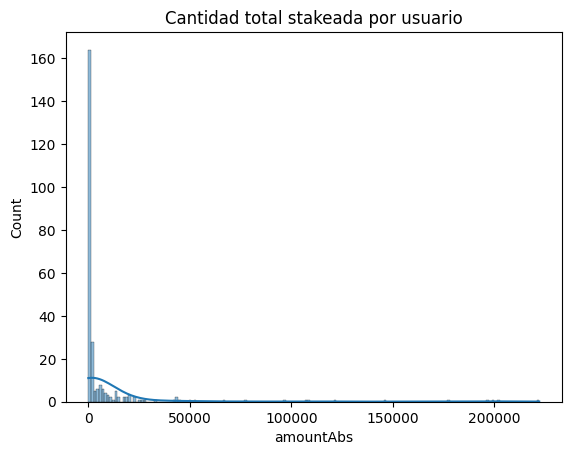

In [29]:
_toplot = dfs.groupby('staker')['amountAbs'].sum()
sns.histplot(_toplot, kde=True).set(title="Cantidad total stakeada por usuario");

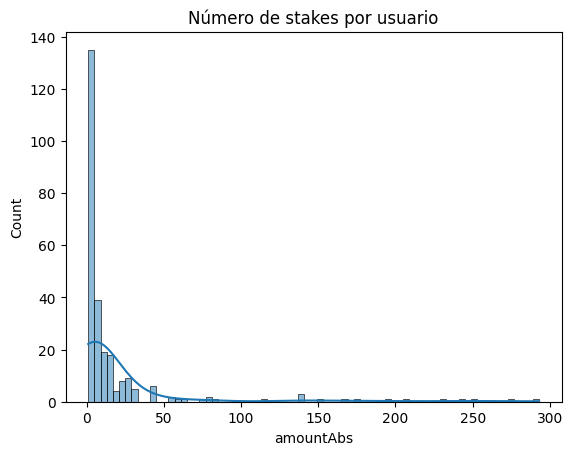

In [30]:
_toplot = dfs.groupby('staker')['amountAbs'].count()
sns.histplot(_toplot, kde=True).set(title="Número de stakes por usuario");

Parece una clásica distribución log-normal, pero, ¿por qué?

## ¿Los que stakean son los que votan?

In [31]:
stakers = dfs[['staker', 'dao']]
stakers

,staker,dao
0,0x26904e77a65ba7ff95803d804ef46fc6d8f33720,0x6bee9b81e434f7afce72a43a4016719315069539
1,0x4abe45a46ff4be05545684ab7aa1894628d9dca6,0x519b70055af55a007110b4ff99b0ea33071c720a
2,0xf16294a979a027f297dace2f618cb57bc4bf5d16,0x294f999356ed03347c7a23bcbcf8d33fa41dc830
3,0xce7298e5ef1ae8af0573edc2ebd03ab0f837e214,0x294f999356ed03347c7a23bcbcf8d33fa41dc830
4,0xa15ca74e65bf72730811abf95163e89ad9b9dff6,0x294f999356ed03347c7a23bcbcf8d33fa41dc830
...,...,...
5105,0xe16d3664b313bd5fb8d911b467047e3cb4ed853d,0xe716ec63c5673b3a4732d22909b38d779fa47c3f
5106,0x1861974f32eacdcced0f81b0f8eccfed58153a9d,0xe716ec63c5673b3a4732d22909b38d779fa47c3f
5107,0xbc3a058d1c919f6b1f48e8846246d04d467902c8,0xe716ec63c5673b3a4732d22909b38d779fa47c3f
5108,0x40a57a5d9b618b9a49307b530736b4f51e008741,0x94a587478c83491b13291265581cb983e7feb540


### ¿cuanta gente stakea su propuesta?

In [32]:
dfp = utils.get_df('dfp').reset_index()
dfp = dfp.merge(dfs[['proposal', 'staker']], left_on=['id', 'proposer'], right_on=['proposal', 'staker'], how='left')
dfp

,network,id,proposer,stage,createdAt,preBoostedAt,boostedAt,quietEndingPeriodBeganAt,closingAt,preBoostedClosingAt,...,originalName,votesForPct,votesAgainstPct,executedAtMonth,createdAtMonth,daoRegister,nvoters,daostake,proposal,staker
0,mainnet,0x0025c38d987acba1f1d446d3690384327ebe06d15f1f...,0xbaaea72417f4dc3e0f52a1783b0913d0f3516634,Executed,2019-10-22 10:07:58,2019-10-22 10:39:28,2019-10-23 12:44:17,NaT,3793-01-23 10:41:40,2019-10-23 10:39:28,...,Genesis Alpha,0.053534,0.0,2019-10,2019-10,registered,8,150.0,NaN,NaN
1,mainnet,0x0033a337b620add50be9ba0fff1128ab866ece51cfdd...,0x052c68abe8e4bf0b78925e488b98f6fdc18a3af9,Executed,2020-01-17 19:07:19,NaT,NaT,NaT,3770-07-14 16:05:00,NaT,...,Trips Community DAO,0.714286,0.0,2020-01,2020-01,registered,1,150.0,NaN,NaN
2,mainnet,0x003c109411e96e5607ce609278536262e12afdaa65ab...,0xb33b9fba681653fe263b31a95766d83d18c2128d,Executed,2020-03-14 17:52:32,2020-03-14 19:53:49,2020-03-15 19:54:03,NaT,3752-09-25 14:56:40,2020-03-15 19:53:49,...,dxDAO,0.249265,0.0,2020-03,2020-03,registered,5,250.0,NaN,NaN
3,mainnet,0x0071c649968f7939fc9729c5dc25a8ae3f50dc86220a...,0x86fd6dd41bad636b5b3b9228bc5642fa0df392e8,Executed,2019-12-14 14:52:54,2019-12-14 18:13:24,2019-12-15 21:57:46,NaT,3778-09-21 00:53:20,2019-12-15 18:13:24,...,FestDAO,0.186118,0.0,2019-12,2019-12,registered,1,50.0,NaN,NaN
4,mainnet,0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4...,0x7cb9032844e722bef2e16a761832c59c96550898,Executed,2019-11-01 19:26:29,2019-11-01 19:34:07,2019-11-03 07:48:08,NaT,3790-05-13 06:23:20,2019-11-02 19:34:07,...,PolkaDAO,0.0,0.000422,2019-11,2019-11,registered,1,150.0,0x007eaf0fc8d6ae35ba3f28bc7cf4b34af659db8161d4...,0x7cb9032844e722bef2e16a761832c59c96550898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4088,xdai,0xff13cd113eda8ffefaba5b8cb4b7126a169a1ca74873...,0x478f1a09bc1477148a91508b9320274dce563605,Executed,2020-02-15 22:45:00,NaT,NaT,NaT,3762-07-13 01:35:00,NaT,...,Cosmos Ethermint DAO,0.0,1.0,2020-02,2020-02,registered,1,150.0,NaN,NaN
4089,xdai,0xff32174f3f2ff80955d5075937f72d07f5bc18364946...,0x91628ddc3a6ff9b48a2f34fc315d243eb07a9501,Executed,2021-06-04 03:27:55,2021-06-10 00:00:55,2021-06-11 00:01:15,NaT,3629-10-03 11:10:00,2021-06-11 00:00:55,...,xDXdao,0.034824,0.0,2021-06,2021-06,registered,1,200.0,0xff32174f3f2ff80955d5075937f72d07f5bc18364946...,0x91628ddc3a6ff9b48a2f34fc315d243eb07a9501
4090,xdai,0xff37f65a5cf37b109fc538ea2d18d2726f4c3c1cfdc3...,0x06044b5359d8df7886366c22c61c7ecd29becac7,Executed,2020-02-11 13:36:25,NaT,NaT,NaT,3763-10-04 19:01:40,NaT,...,xDAItestDAO,1.0,0.0,2020-02,2020-02,unRegistered,1,150.0,NaN,NaN
4091,xdai,0xff6c045d9ab8f514b7dce6317ac1ff16786cad69bd4a...,0x8e900cf9bd655e34bb610f0ef365d8d476fd7337,Executed,2022-02-08 09:23:30,2022-02-08 09:27:40,2022-02-09 10:51:15,NaT,3563-02-07 06:41:40,2022-02-09 09:27:40,...,xDXdao,0.032093,0.0,2022-02,2022-02,registered,3,200.0,NaN,NaN


In [33]:
(dfp['staker'].isna()).value_counts()

True     2785
False    1308
Name: staker, dtype: int64

De las 4059 propuestas, en 1290 (30%) el proposer ha stakeado.

### ¿cuanta gente vota su propuesta?

In [34]:
dfv = pd.read_feather(DAOSTACK.VOTES)
dfpv = dfp.merge(dfv[['proposal', 'voter']], left_on=['id', 'proposer'], right_on=['proposal', 'voter'], how='left', suffixes=(None, "_y"))

dfpv['isVoter'] = ~dfpv['voter'].isna()
dfpv['isStaker'] = ~dfpv['staker'].isna()
dfpv = dfpv.drop(columns=['voter', 'staker', 'proposal', 'proposal_y'])

dfpv['isVoter'].value_counts()

False    2516
True     1577
Name: isVoter, dtype: int64

De las 4059 propuestas, en 1559 (38%) el proposer ha votado.

In [35]:
dfpv[['isVoter', 'isStaker']].value_counts()

isVoter  isStaker
False    False       1888
True     False        897
         True         680
False    True         628
dtype: int64

Hay 893 personas que han votado pero no stakeado, y 624 que no han stakeado pero sí votado. Hay 666 proposers que han stakeado y votado (16%).

### ¿Cambia la gente que stakea su propuesta a lo largo del tiempo?

Mean: 0.3195699975568043
network
mainnet    0.309187
xdai       0.335388
Name: isStaker, dtype: float64
saving to ../logseq/assets/nb_figures/stakers/pct_proposals_selfstaked.png
Use ![Porcentaje de propuestas autoestakeadas en los últimos 30d](../assets/nb_figures/stakers/pct_proposals_selfstaked.png) to embed it in logseq


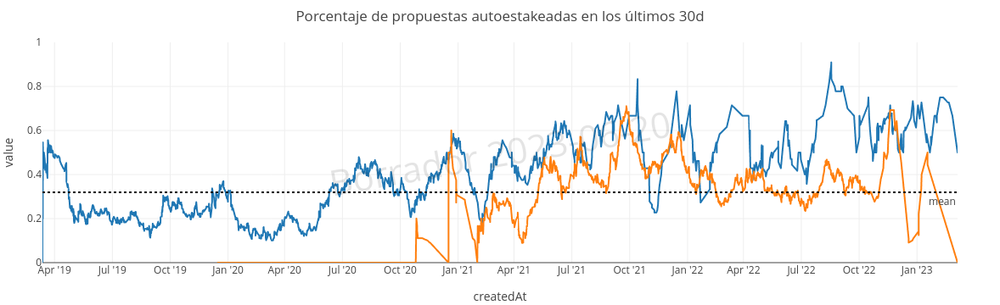

In [36]:
# TODO: By network
WINDOW_SIZE = '30d'

_toplot = dfpv.groupby('network').apply(lambda x: x.set_index('createdAt').sort_index().rolling(WINDOW_SIZE)['isStaker'].mean())
fig = px.line(_toplot.reset_index(level='network'), color='network', title=f"Porcentaje de propuestas autoestakeadas en los últimos {WINDOW_SIZE}")
print("Mean:", dfpv['isStaker'].mean())
print(dfpv.groupby('network')['isStaker'].mean())
fig.add_hline(y=dfpv['isStaker'].mean(), line_dash="dot", annotation_text="mean", annotation_position="bottom right")
fig.update_yaxes(range=(0,1))
utils.plot.save_fig(fig, 'stakers/pct_proposals_selfstaked.png')

- Podemos ver que hay una primera fase de pruebas y hype en la que se usaba mucho el autostaking. Luego, menos de 1/4 de las propuestas eran autoestakeadas, hasta llegar a julio 2020 y que casi todas las propuestas sean stakeadas, demostrando pues mi hipótesis de que el 11J crearía la "necesidad" de stakear.  
- Con un análisis más avanzado, teniendo en cuenta la cantidad stakeada, o las "coaliciones" que se forman, seguramente veamos que un porcentaje muy alto del staking es de la gente que propone (aunque se vayan "turnando").  

#### Repetición solo dxDAO

Mean: 0.3195699975568043
network
mainnet    0.309187
xdai       0.335388
Name: isStaker, dtype: float64
saving to ../logseq/assets/nb_figures/stakers/pct_proposals_selfstaked_dxDAO.png
Use ![Porcentaje de propuestas autoestakeadas en los últimos 30d en dxDAO](../assets/nb_figures/stakers/pct_proposals_selfstaked_dxDAO.png) to embed it in logseq


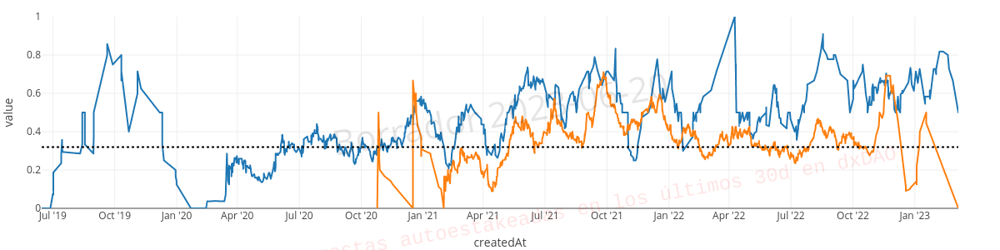

In [37]:
# TODO: By network
WINDOW_SIZE = '30d'

_toplot = dfpv[dfpv['group'] == 'dxDAO'].groupby('network').apply(lambda x: x.set_index('createdAt').sort_index().rolling(WINDOW_SIZE)['isStaker'].mean())
fig = px.line(_toplot.reset_index(level='network'), color='network', title=f"Porcentaje de propuestas autoestakeadas en los últimos {WINDOW_SIZE} en dxDAO")
print("Mean:", dfpv['isStaker'].mean())
print(dfpv.groupby('network')['isStaker'].mean())
fig.add_hline(y=dfpv['isStaker'].mean(), line_dash="dot", annotation_text="mean", annotation_position="bottom right")
fig.update_yaxes(range=(0,1))
utils.plot.save_fig(fig, 'stakers/pct_proposals_selfstaked_dxDAO.png', debug=True)

#### Repetición SIN dxDAO

saving to ../logseq/assets/nb_figures/stakers/pct_proposals_selfstaked_notdxDAO.png
Use ![Porcentaje de propuestas autostakeadas en los últimos 30d sin dxDAO](../assets/nb_figures/stakers/pct_proposals_selfstaked_notdxDAO.png) to embed it in logseq


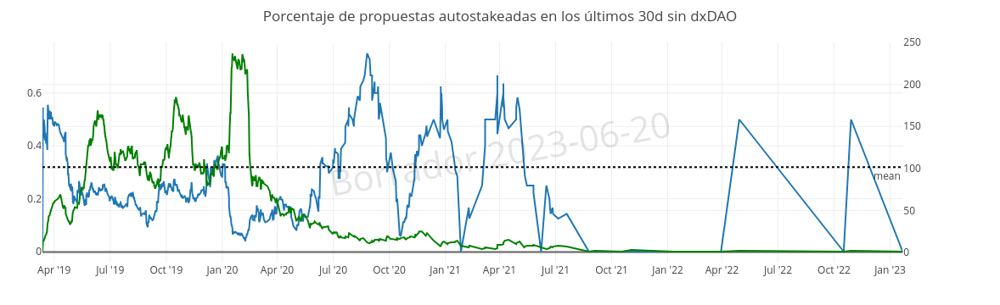

In [81]:
from plotly.subplots import make_subplots

# TODO: By network
WINDOW_SIZE = '30d'

"""
_toplot = dfpv[dfpv['group'] != 'dxDAO'].groupby('network').apply(lambda x: x.set_index('createdAt').sort_index().rolling(WINDOW_SIZE)['isStaker'].mean())
fig = px.line(_toplot.reset_index(level='network'), color='network', title=f"Porcentaje de propuestas autoestakeadas en los últimos {WINDOW_SIZE} sin dxDAO")
print("Mean:", dfpv['isStaker'].mean())
print(dfpv.groupby('network')['isStaker'].mean())
"""
_dfpv = dfpv[dfpv['group'] != 'dxDAO'].set_index('createdAt').sort_index()
_toplot = _dfpv.rolling(WINDOW_SIZE)['isStaker'].mean().to_frame()
_toplot['cnt'] = _dfpv.rolling(WINDOW_SIZE)['isStaker'].count().to_frame()

fig = make_subplots(
    specs=[[{"secondary_y": True}]],
)

# fig = px.line(_toplot, y=['isStaker'], hover_data=['cnt'], )
fig.add_trace(
    go.Scatter(
        x=_toplot.index,
        y=_toplot['isStaker'],
    )
)
fig.add_hline(y=dfpv['isStaker'].mean(), line_dash="dot", annotation_text="mean", annotation_position="bottom right")
fig.add_trace(
    go.Scatter(
        x=_toplot.index,
        y=_toplot['cnt'],
        line_color='green',
    ), secondary_y=True,
)

#fig.update_yaxes(range=(0,1))
fig.update_layout(title=f"Porcentaje de propuestas autostakeadas en los últimos {WINDOW_SIZE} sin dxDAO")
utils.plot.save_fig(fig, 'stakers/pct_proposals_selfstaked_notdxDAO.png')

In [80]:
_toplot.corr()

,isStaker,cnt
isStaker,1.000000,-0.624981
cnt,-0.624981,1.000000


saving to ../logseq/assets/nb_figures/stakers/pct_proposals_selfstaked.png
Use ![Porcentaje de propuestas autostakeadas en los últimos 30d](../assets/nb_figures/stakers/pct_proposals_selfstaked.png) to embed it in logseq


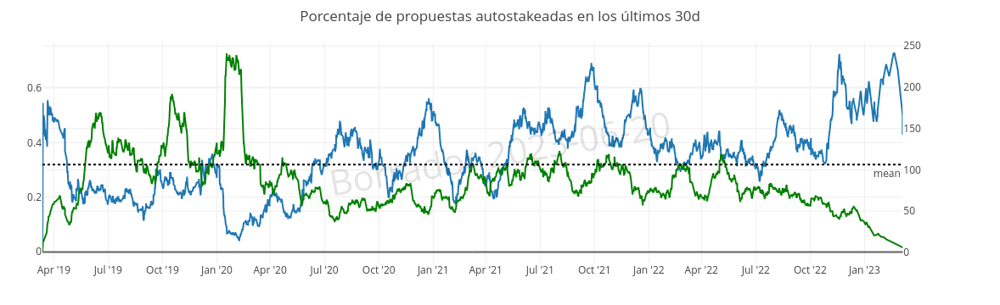

In [83]:
WINDOW_SIZE = '30d'

_dfpv = dfpv.set_index('createdAt').sort_index()
_toplot = _dfpv.rolling(WINDOW_SIZE)['isStaker'].mean().to_frame()
_toplot['cnt'] = _dfpv.rolling(WINDOW_SIZE)['isStaker'].count().to_frame()

fig = make_subplots(
    specs=[[{"secondary_y": True}]],
)

# fig = px.line(_toplot, y=['isStaker'], hover_data=['cnt'], )
fig.add_trace(
    go.Scatter(
        x=_toplot.index,
        y=_toplot['isStaker'],
    )
)
fig.add_hline(y=dfpv['isStaker'].mean(), line_dash="dot", annotation_text="mean", annotation_position="bottom right")
fig.add_trace(
    go.Scatter(
        x=_toplot.index,
        y=_toplot['cnt'],
        line_color='green',
    ), secondary_y=True,
)

#fig.update_yaxes(range=(0,1))
fig.update_layout(title=f"Porcentaje de propuestas autostakeadas en los últimos {WINDOW_SIZE}")
utils.plot.save_fig(fig, 'stakers/pct_proposals_selfstaked.png')

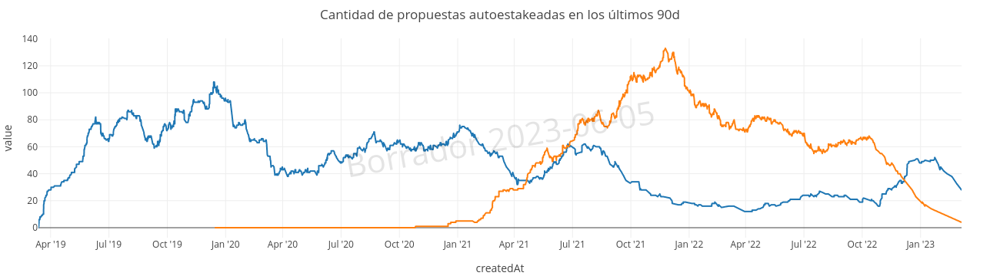

In [41]:
_toplot = dfpv.groupby('network').apply(lambda x: x.set_index('createdAt').sort_index().rolling(WINDOW_SIZE)['isStaker'].sum())
fig = px.line(_toplot.reset_index(level='network'), color='network', title=f"Cantidad de propuestas autoestakeadas en los últimos {WINDOW_SIZE}")
fig